In [44]:
import os
import time
import datetime
import json
import gc
from numba import jit
import numpy as np
import pandas as pd

from tqdm import tqdm_notebook

import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostRegressor, CatBoostClassifier
from sklearn import metrics

from itertools import product

import matplotlib
import matplotlib.pyplot as plt 
import seaborn as sns 
color = sns.color_palette()
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()
import cufflinks as cf
cf.go_offline()
import altair as alt
alt.renderers.enable('notebook')
from altair.vega import v5
from IPython.display import HTML

In [5]:
train_identity = pd.read_csv('train_identity.csv')
train_transaction = pd.read_csv('train_transaction.csv')
test_identity = pd.read_csv('test_identity.csv')
test_transaction = pd.read_csv('test_transaction.csv')
sub = pd.read_csv('sample_submission.csv')
# let's combine the data and work with the whole dataset
train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')
test = pd.merge(test_transaction, test_identity, on='TransactionID', how='left')

In [6]:
train.shape

(590540, 434)

In [7]:
test.shape

(506691, 433)

In [8]:
train_identity.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [9]:
train_transaction.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
del train_identity, train_transaction, test_identity, test_transaction

In [11]:
train.dtypes

TransactionID       int64
isFraud             int64
TransactionDT       int64
TransactionAmt    float64
ProductCD          object
card1               int64
card2             float64
card3             float64
card4              object
card5             float64
card6              object
addr1             float64
addr2             float64
dist1             float64
dist2             float64
P_emaildomain      object
R_emaildomain      object
C1                float64
C2                float64
C3                float64
C4                float64
C5                float64
C6                float64
C7                float64
C8                float64
C9                float64
C10               float64
C11               float64
C12               float64
C13               float64
                   ...   
id_11             float64
id_12              object
id_13             float64
id_14             float64
id_15              object
id_16              object
id_17             float64
id_18       

In [ ]:
#TransactionDT: timedelta from a given reference datetime (not an actual timestamp)
#TransactionAMT: transaction payment amount in USD
#ProductCD: product code, the product for each transaction
#card1 - card6: payment card information, such as card type, card category, issue bank, country, etc.
#addr: address
#dist: distance
#P_ and (R__) emaildomain: purchaser and recipient email domain
#C1-C14: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.
#D1-D15: timedelta, such as days between previous transaction, etc.
#M1-M9: match, such as names on card and address, etc.
#Vxxx: Vesta engineered rich features, including ranking, counting, and other entity relations.
#Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions. 
#They're collected by Vesta’s fraud protection system and digital security partners.
#(The field names are masked and pairwise dictionary will not be provided for privacy protection and contract agreement)
#DeviceType
#DeviceInfo
#id12 - id38

In [57]:
obj_cols = train.dtypes
obj_cols[obj_cols=='object']

ProductCD        object
card4            object
card6            object
P_emaildomain    object
R_emaildomain    object
M1               object
M2               object
M3               object
M4               object
M5               object
M6               object
M7               object
M8               object
M9               object
id_12            object
id_15            object
id_16            object
id_23            object
id_27            object
id_28            object
id_29            object
id_30            object
id_31            object
id_33            object
id_34            object
id_35            object
id_36            object
id_37            object
id_38            object
DeviceType       object
DeviceInfo       object
dtype: object

In [12]:
train.describe()

,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,...,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,5.905400e+05,590540.000000,5.905400e+05,590540.000000,590540.000000,581607.000000,588975.000000,586281.000000,524834.000000,524834.000000,...,139369.000000,45113.000000,139318.000000,139261.000000,5159.000000,5169.000000,4747.000000,5132.000000,5163.000000,77586.000000
mean,3.282270e+06,0.034990,7.372311e+06,135.027176,9898.734658,362.555488,153.194925,199.278897,290.733794,86.800630,...,189.451377,14.237337,353.128174,403.882666,368.269820,16.002708,12.800927,329.608924,149.070308,26.508597
std,1.704744e+05,0.183755,4.617224e+06,239.162522,4901.170153,157.793246,11.336444,41.244453,101.741072,2.690623,...,30.375360,1.561302,141.095343,152.160327,198.847038,6.897665,2.372447,97.461089,32.101995,3.737502
min,2.987000e+06,0.000000,8.640000e+04,0.251000,1000.000000,100.000000,100.000000,100.000000,100.000000,10.000000,...,100.000000,10.000000,100.000000,100.000000,100.000000,10.000000,11.000000,100.000000,100.000000,0.000000
25%,3.134635e+06,0.000000,3.027058e+06,43.321000,6019.000000,214.000000,150.000000,166.000000,204.000000,87.000000,...,166.000000,13.000000,266.000000,256.000000,252.000000,14.000000,11.000000,321.000000,119.000000,24.000000
50%,3.282270e+06,0.000000,7.306528e+06,68.769000,9678.000000,361.000000,150.000000,226.000000,299.000000,87.000000,...,166.000000,15.000000,341.000000,472.000000,252.000000,14.000000,11.000000,321.000000,149.000000,24.000000
75%,3.429904e+06,0.000000,1.124662e+07,125.000000,14184.000000,512.000000,150.000000,226.000000,330.000000,87.000000,...,225.000000,15.000000,427.000000,533.000000,486.500000,14.000000,15.000000,371.000000,169.000000,32.000000
max,3.577539e+06,1.000000,1.581113e+07,31937.391000,18396.000000,600.000000,231.000000,237.000000,540.000000,102.000000,...,229.000000,29.000000,671.000000,661.000000,854.000000,44.000000,26.000000,548.000000,216.000000,32.000000


In [13]:
train.isnull().any().sum()

414

In [14]:
# missing values
train_data_na = (train.isnull().sum() / len(train)) * 100
train_data_na =train_data_na.drop(train_data_na[train_data_na == 0].index).sort_values(ascending=False)
missing_data = pd.DataFrame({'Missing Ratio' :train_data_na})
missing_data.head(20)

,Missing Ratio
id_24,99.196159
id_25,99.130965
id_07,99.127070
id_08,99.127070
id_21,99.126393
id_26,99.125715
id_22,99.124699
id_23,99.124699
id_27,99.124699
dist2,93.628374


/Users/shuozhang/anaconda/lib/python2.7/site-packages/seaborn/categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


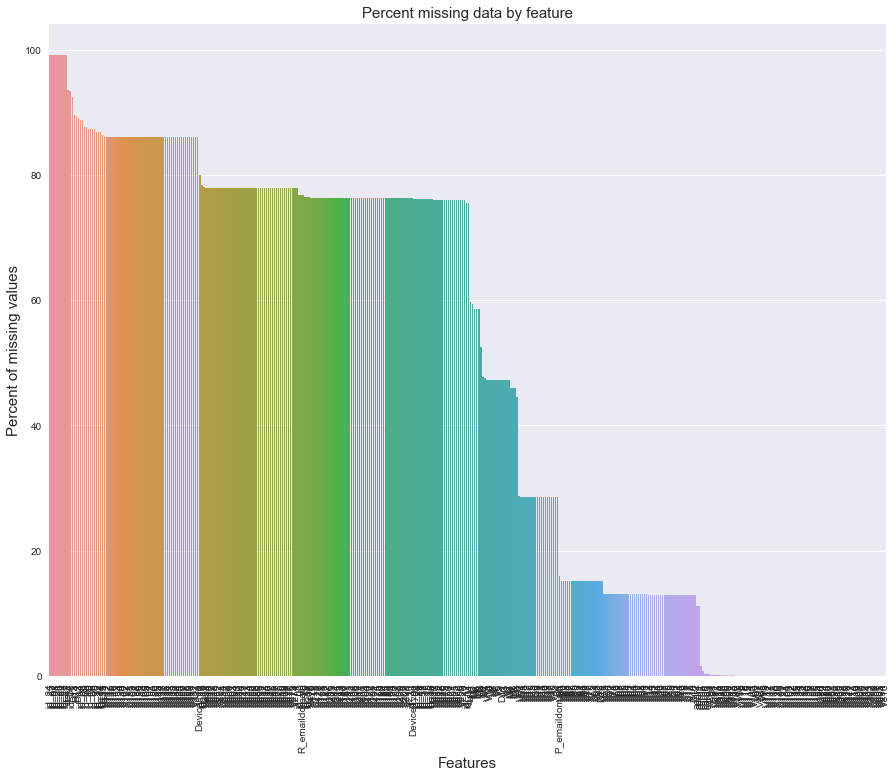

In [15]:
f, ax = plt.subplots(figsize=(15, 12))
plt.xticks(rotation='90')
sns.barplot(x=train_data_na.index, y=train_data_na)
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)
plt.show()

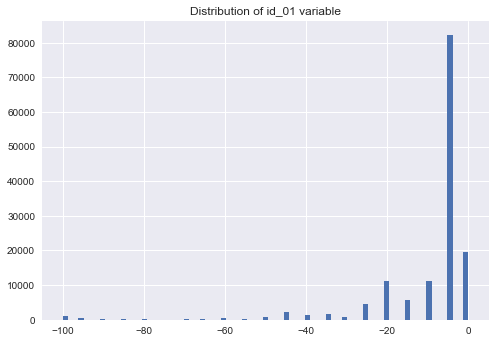

In [16]:
#eda
# id_01 - id_11 are continuous variables, i
# d_12 - id_38 are categorical and the last two columns are obviously also categorical.
plt.hist(train['id_01'].dropna(), bins=77);
plt.title('Distribution of id_01 variable');
plt.show()

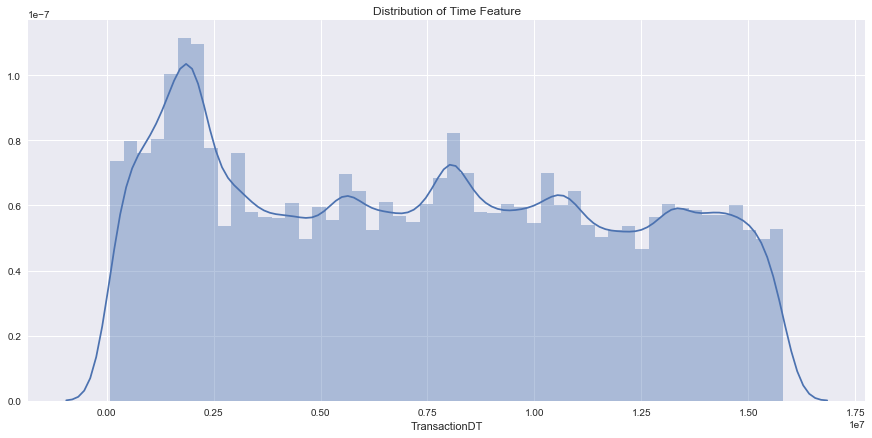

In [60]:
plt.figure(figsize=(15,7))
plt.title('Distribution of Time Feature')
sns.distplot(train.TransactionDT)
plt.show()

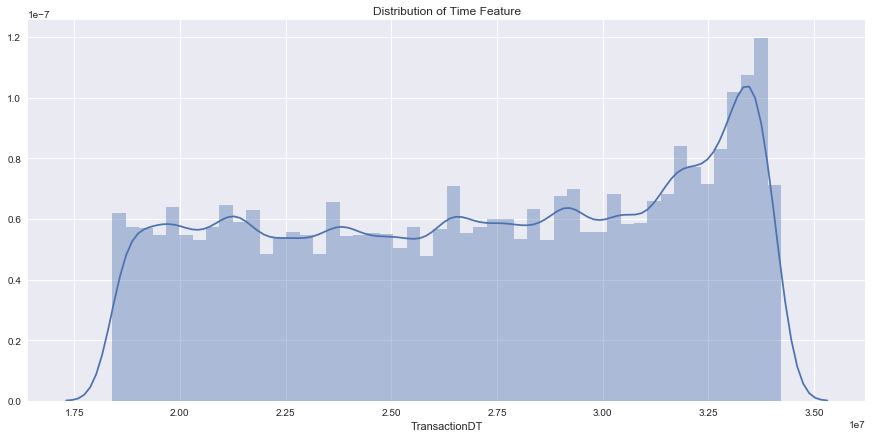

In [61]:
plt.figure(figsize=(15,7))
plt.title('Distribution of Time Feature')
sns.distplot(test.TransactionDT)
plt.show()

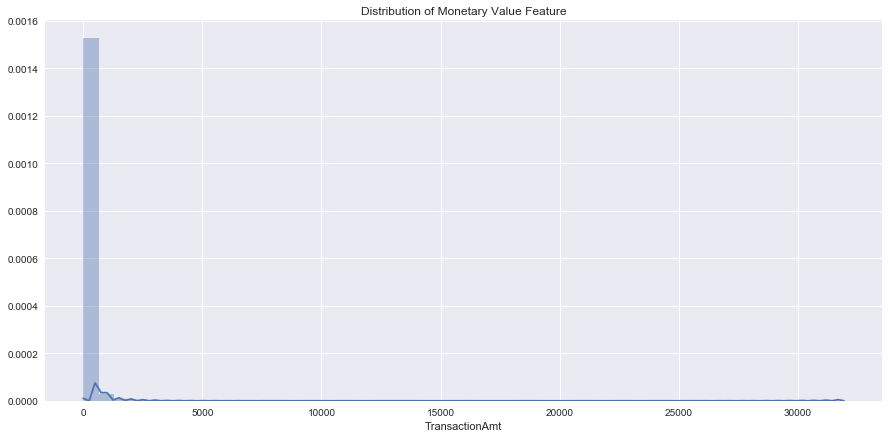

In [62]:
plt.figure(figsize=(15,7))
plt.title('Distribution of Monetary Value Feature')
sns.distplot(train.TransactionAmt)
plt.show()

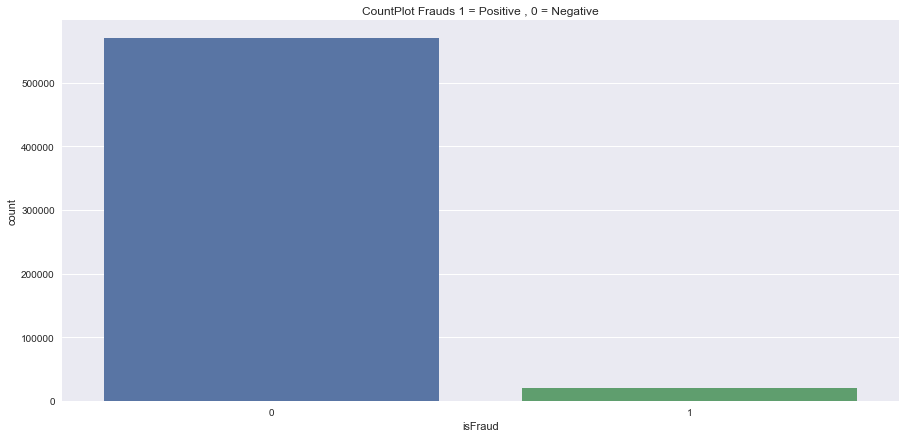

In [63]:
plt.figure(figsize=(15,7))
sns.countplot(x='isFraud',data=train)
plt.title('CountPlot Frauds 1 = Positive , 0 = Negative')
plt.show()

In [72]:
count = train.isFraud.value_counts()
regular = count[0]
frauds = count[1]
total= frauds + regular 
perc_reg = (float(regular)/total)*100
perc_frauds = (float(frauds)/total)*100
print('There were {} non-fraudulent transactions ({:.3f}%) and {} fraudulent transactions ({:.3f}%).'.format(regular, perc_reg, frauds, perc_frauds))

There were 569877 non-fraudulent transactions (96.501%) and 20663 fraudulent transactions (3.499%).


In [17]:
train['id_01'].value_counts(dropna=False, normalize=True).head()

NaN      0.755761
-5.0     0.139144
 0.0     0.033114
-10.0    0.019062
-20.0    0.018984
Name: id_01, dtype: float64

In [18]:
train['id_03'].value_counts(dropna=False, normalize=True).head()

NaN     0.887689
 0.0    0.108211
 1.0    0.001461
 3.0    0.001131
 2.0    0.000713
Name: id_03, dtype: float64

In [19]:
#id_03 has 88% of missing values and 98% of values are either missing or equal to 0.

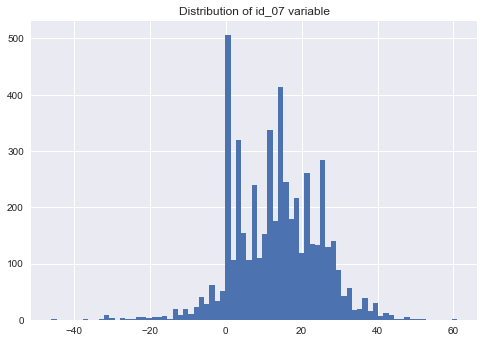

In [20]:
plt.hist(train['id_07'].dropna(), bins=77);
plt.title('Distribution of id_07 variable');
plt.show()

In [21]:
#Some of features seem to be normalized

In [22]:
train['id_11'].value_counts(dropna=False, normalize=True).head()

NaN            0.761273
 100.000000    0.225492
 95.080002     0.002085
 95.160004     0.001277
 97.120003     0.000745
Name: id_11, dtype: float64

In [23]:
#22% of values in id_11 are equal to 100and 76% are missing.

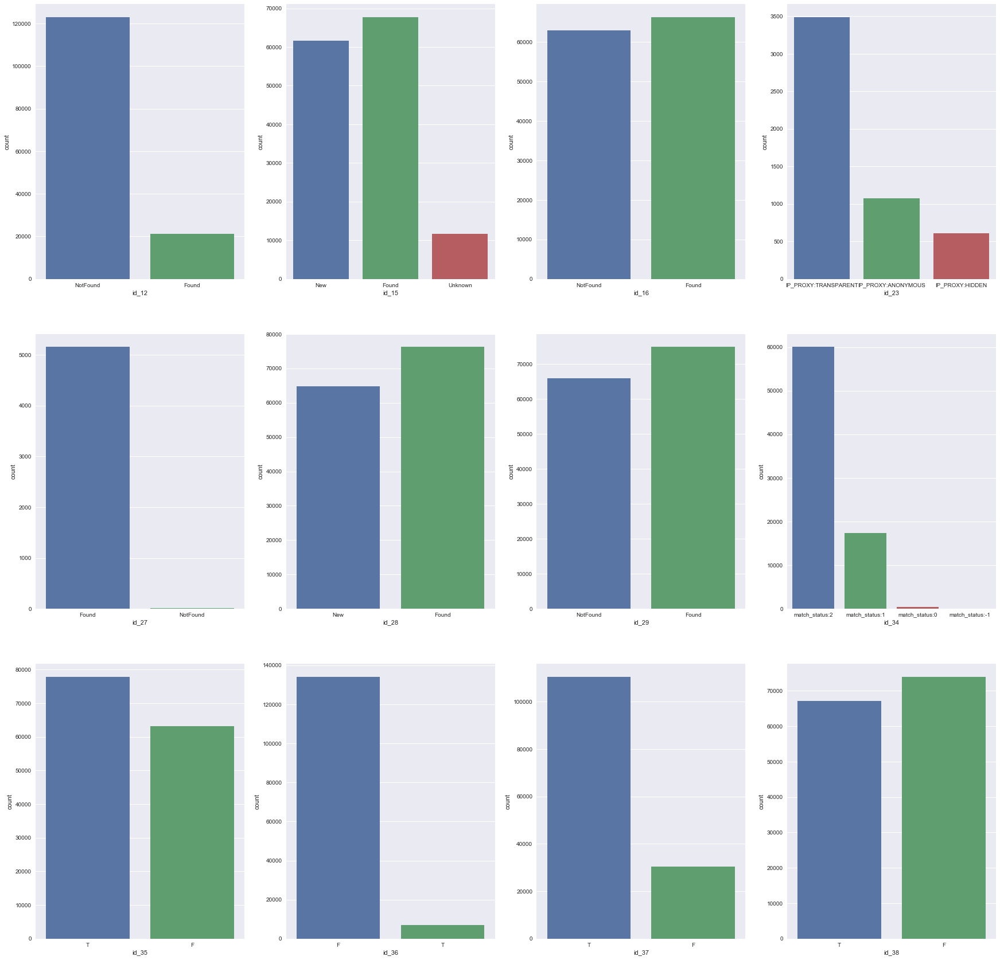

In [27]:
# categorical
fig, ax = plt.subplots(figsize = (30, 30))
plt.subplot(3, 4, 1)
sns.countplot(train['id_12']);
plt.subplot(3, 4, 2)
sns.countplot(train['id_15']);
plt.subplot(3, 4, 3)
sns.countplot(train['id_16']);
plt.subplot(3, 4, 4)
sns.countplot(train['id_23']);
plt.subplot(3, 4, 5)
sns.countplot(train['id_27']);
plt.subplot(3, 4, 6)
sns.countplot(train['id_28']);
plt.subplot(3, 4, 7)
sns.countplot(train['id_29']);
plt.subplot(3, 4, 8)
sns.countplot(train['id_34']);
plt.subplot(3, 4, 9)
sns.countplot(train['id_35']);
plt.subplot(3, 4, 10)
sns.countplot(train['id_36']);
plt.subplot(3, 4, 11)
sns.countplot(train['id_37']);
plt.subplot(3, 4, 12)
sns.countplot(train['id_38']);
plt.show()

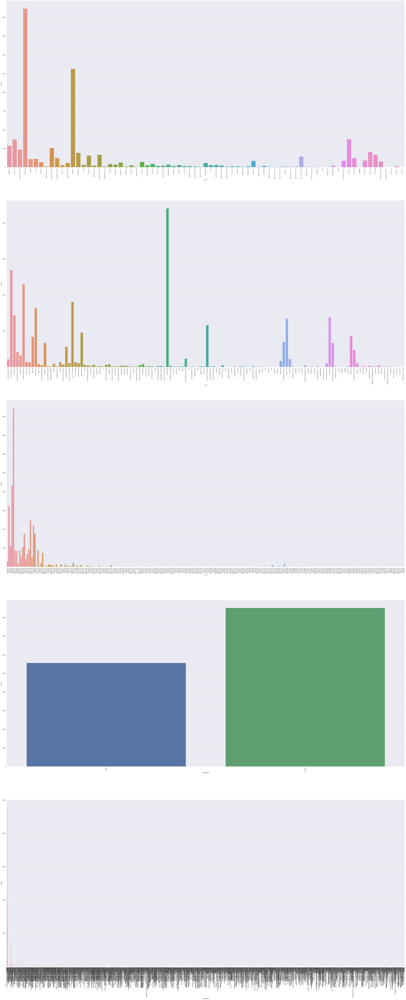

In [54]:
# client's device
fig, ax = plt.subplots(figsize = (60, 180))
plt.subplot(6, 1, 1)
sns.countplot(train['id_30']); # window 10, window 7
plt.xticks(rotation=90)
plt.subplot(6, 1, 2)
sns.countplot(train['id_31']); # chrome
plt.xticks(rotation=90)
plt.subplot(6, 1, 3)
sns.countplot(train['id_33']); # 1920*1080
plt.xticks(rotation=90)
plt.subplot(6, 1, 4)
sns.countplot(train['DeviceType']); # desktop mobile
plt.xticks(rotation=90)
plt.subplot(6, 1, 5)
sns.countplot(train['DeviceInfo']); # window mac ios
plt.xticks(rotation=90)
plt.show()

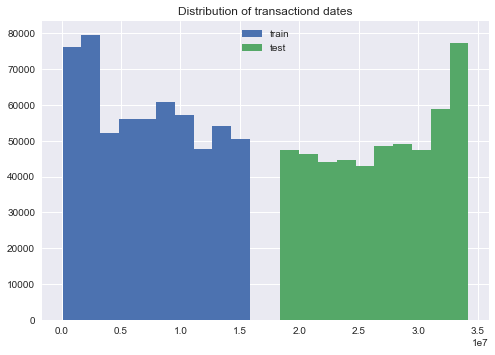

In [31]:
plt.hist(train['TransactionDT'], label='train');
plt.hist(test['TransactionDT'], label='test');
plt.legend();
plt.title('Distribution of transactiond dates');
plt.show()

In [ ]:
#A very important idea: it seems that train and test transaction dates don't overlap,
# so it would be prudent to use time-based split for validation

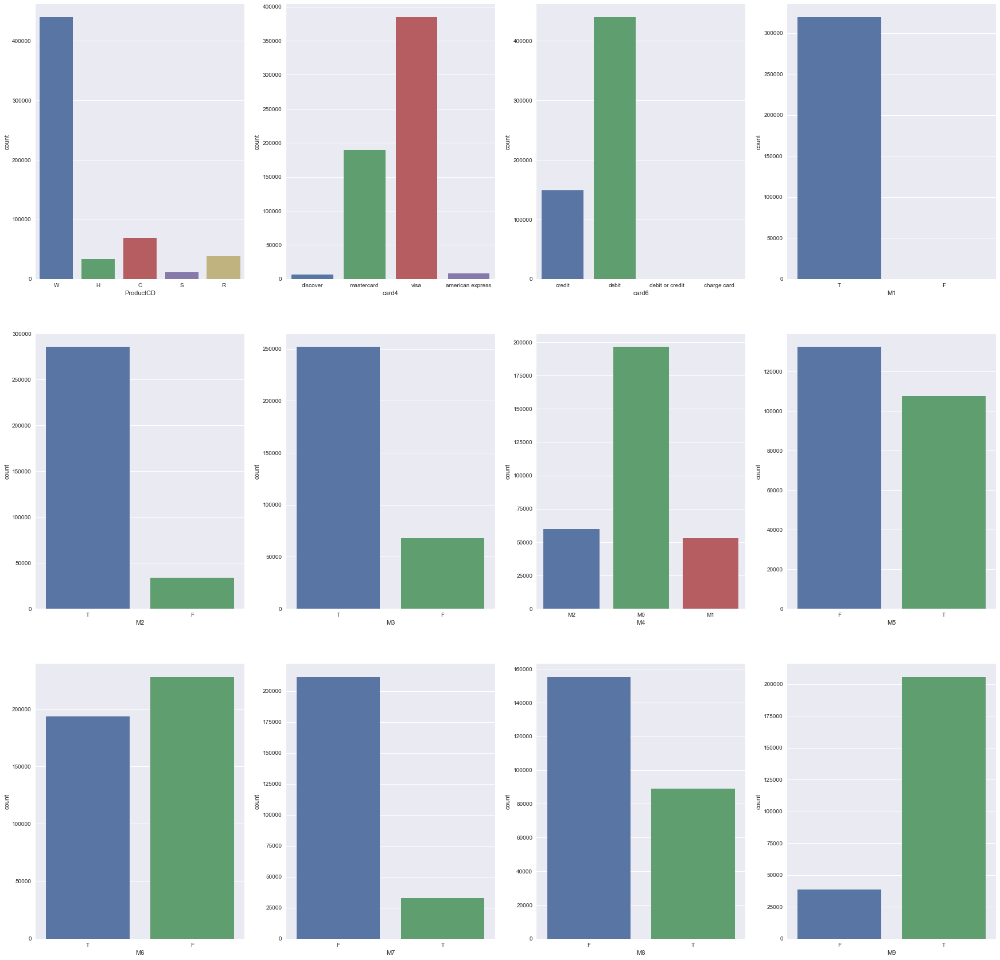

In [56]:
fig, ax = plt.subplots(figsize = (30, 30))
plt.subplot(3, 4, 1)
sns.countplot(train['ProductCD']);
plt.subplot(3, 4, 2)
sns.countplot(train['card4']);
plt.subplot(3, 4, 3)
sns.countplot(train['card6']);
plt.subplot(3, 4, 4)
sns.countplot(train['M1']);
plt.subplot(3, 4, 5)
sns.countplot(train['M2']);
plt.subplot(3, 4, 6)
sns.countplot(train['M3']);
plt.subplot(3, 4, 7)
sns.countplot(train['M4']);
plt.subplot(3, 4, 8)
sns.countplot(train['M5']);
plt.subplot(3, 4, 9)
sns.countplot(train['M6']);
plt.subplot(3, 4, 10)
sns.countplot(train['M7']);
plt.subplot(3, 4, 11)
sns.countplot(train['M8']);
plt.subplot(3, 4, 12)
sns.countplot(train['M9']);
plt.show()

In [ ]:
# card6 is type of card, card4 is credit card company

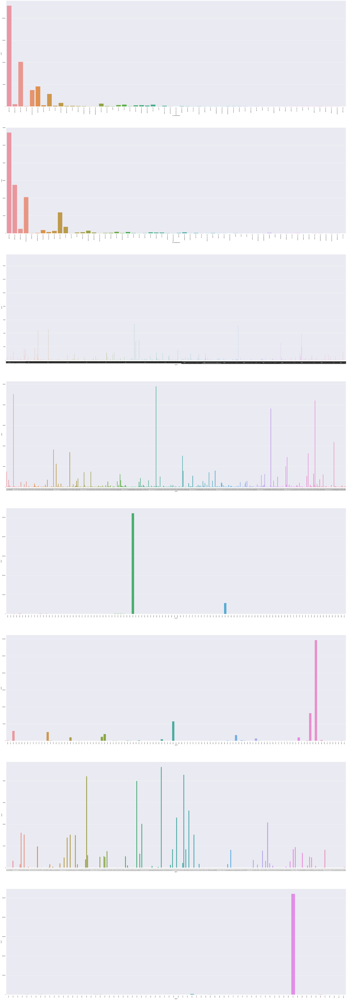

In [55]:
fig, ax = plt.subplots(figsize = (60, 180))
plt.subplot(8, 1, 1)
sns.countplot(train['P_emaildomain']); # gmail.com hotmail.com yahoo.com
plt.xticks(rotation=90)
plt.subplot(8, 1, 2)
sns.countplot(train['R_emaildomain']); # gmail.com hotmail.com
plt.xticks(rotation=90)
plt.subplot(8, 1, 3)
sns.countplot(train['card1']); 
plt.xticks(rotation=90)
plt.subplot(8, 1, 4)
sns.countplot(train['card2']);
plt.xticks(rotation=90)
plt.subplot(8, 1, 5)
sns.countplot(train['card3']);
plt.xticks(rotation=90)
plt.subplot(8, 1, 6)
sns.countplot(train['card5']);
plt.xticks(rotation=90)
plt.subplot(8, 1, 7)
sns.countplot(train['addr1']);
plt.xticks(rotation=90)
plt.subplot(8, 1, 8)
sns.countplot(train['addr2']);
plt.xticks(rotation=90)
plt.show()

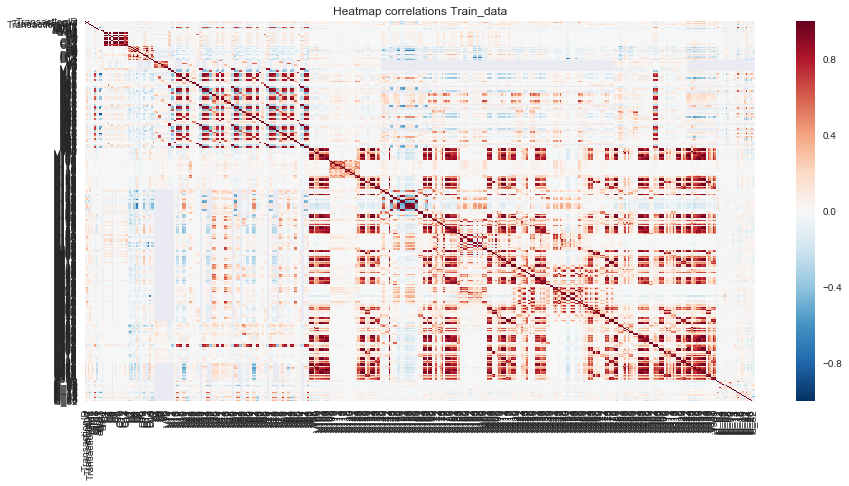

In [74]:
# corr
corr = train.corr()
plt.figure(figsize=(15,7))
sns.heatmap(corr)
plt.title('Heatmap correlations Train_data')
plt.show()

In [75]:
frauds = train[train['isFraud']==1]

In [76]:
notfrauds= train[train['isFraud']==0]

In [77]:
frauds.TransactionAmt.describe()

count    20663.000000
mean       149.244779
std        232.212163
min          0.292000
25%         35.044000
50%         75.000000
75%        161.000000
max       5191.000000
Name: TransactionAmt, dtype: float64

In [78]:
notfrauds.TransactionAmt.describe()

count    569877.000000
mean        134.511665
std         239.395078
min           0.251000
25%          43.970000
50%          68.500000
75%         120.000000
max       31937.391000
Name: TransactionAmt, dtype: float64

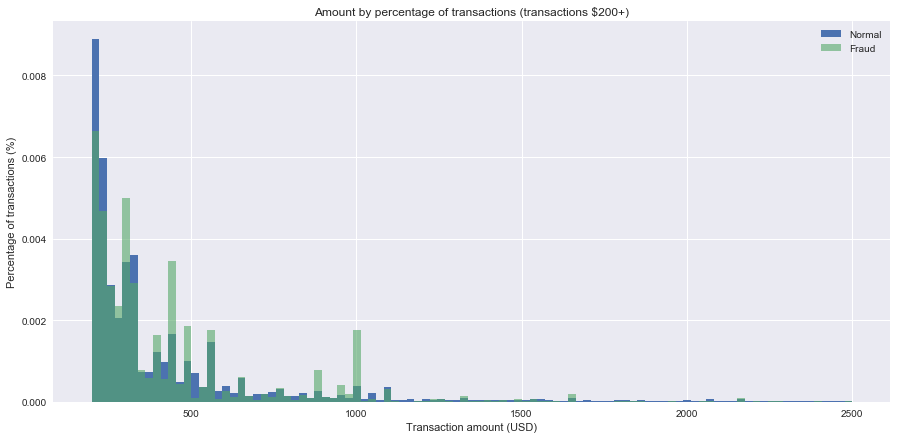

In [79]:
#plot of high value transactions
plt.figure(figsize=(15,7))
bins = np.linspace(200, 2500, 100)
plt.hist(notfrauds.TransactionAmt, bins, alpha=1, normed=True, label='Normal')
plt.hist(frauds.TransactionAmt, bins, alpha=0.6, normed=True, label='Fraud')
plt.legend(loc='upper right')
plt.title("Amount by percentage of transactions (transactions \$200+)")
plt.xlabel("Transaction amount (USD)")
plt.ylabel("Percentage of transactions (%)");
plt.show()

In [ ]:
#Since the fraud cases are relatively few in number compared to bin size, 
#we see the data looks predictably more variable. In the long tail, especially, 
#we are likely observing only a single fraud transaction. 
#It would be hard to differentiate fraud from normal transactions by transaction amount alone.